In [1]:
import pandas as pd
import numpy as np
import nltk
from nltk.tokenize import RegexpTokenizer, sent_tokenize, word_tokenize
from nltk.corpus import stopwords
from nltk.tag import pos_tag, map_tag
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import pickle
%matplotlib inline

# Read Data

In [2]:
raw_pf_df = pd.read_csv('kaggle_poem_dataset.csv')
raw_pf_df['Author'] = raw_pf_df.Author.astype('category')
raw_pf_df.columns = [name.lower() for name in raw_pf_df.columns]
raw_pf_df = raw_pf_df.drop(['unnamed: 0', 'poetry foundation id'], axis=1)

In [3]:
print(raw_pf_df.head())

              author           title  \
0     Wendy Videlock               !   
1  Hailey Leithauser               0   
2      Jody Gladding      1-800-FEAR   
3     Joseph Brodsky  1 January 1965   
4       Ted Berrigan         3 Pages   

                                             content  
0  Dear Writers, I’m compiling the first in what ...  
1  Philosophic\nin its complex, ovoid emptiness,\...  
2  We'd  like  to  talk  with  you  about  fear t...  
3  The Wise Men will unlearn your name.\nAbove yo...  
4  For Jack Collom\n10 Things I do Every Day\n\np...  


# Parse, Explore, and Filter

## remove duplicates and nulls

In [4]:
print(raw_pf_df.describe())
print('*****************')
pf_df = raw_pf_df.copy().drop_duplicates(subset=['content']).drop_duplicates(subset=['author','title']).dropna()
print(pf_df.describe())

                     author  title content
count                 15652  15652   15652
unique                 3310  14997   15638
top     William Shakespeare   Song       i
freq                     85     19       3
*****************
                     author  title  \
count                 15607  15607   
unique                 3310  14989   
top     William Shakespeare   Song   
freq                     85     19   

                                                  content  
count                                               15607  
unique                                              15607  
top     In the next room, Peter’s gloved hands crack\n...  
freq                                                    1  


In [5]:
print(pf_df.author.describe())

count                   15607
unique                   3310
top       William Shakespeare
freq                       85
Name: author, dtype: object


## clean strings

In [6]:
import string, re
from nltk.corpus import words
import multiprocessing as mp
def clean_text(text):
    text = text.lower()
    text = re.sub(' +', ' ', text)
    text = text.replace('\%','')
    text = re.sub('\[.*?\]', '', text)
    text = re.sub('https?://\S+|www\.\S+', '', text)
    text = re.sub('<.*?>+', '', text)
#     text = re.sub('[%s]' % re.escape(string.punctuation), '', text)
    text = re.sub('\w*\d\w*', '', text)
    tokens = re.split("\s|[!,.?]", text)
    text = " ".join([s.strip(string.punctuation) for s in tokens])
    text = text.encode("ascii", "ignore").decode()
    return text.strip()

def clean_list(list_of_strings):
    return [clean_text(string) for string in list_of_strings if string]

In [7]:
# create column to store document as list of lines
pf_df['line'] = pf_df.content.str.split('\n')

#clean each line in the list of lines
pf_df['line'] = pf_df['line'].map(clean_list)

In [8]:
pf_df.head()

,author,title,content,line
0,Wendy Videlock,!,"Dear Writers, I’m compiling the first in what ...",[dear writers im compiling the first in what ...
1,Hailey Leithauser,0,"Philosophic\nin its complex, ovoid emptiness,\...","[philosophic, in its complex ovoid emptiness,..."
2,Jody Gladding,1-800-FEAR,We'd like to talk with you about fear t...,[we'd like to talk with you about fear ...
3,Joseph Brodsky,1 January 1965,The Wise Men will unlearn your name.\nAbove yo...,"[the wise men will unlearn your name, above yo..."
4,Ted Berrigan,3 Pages,For Jack Collom\n10 Things I do Every Day\n\np...,"[for jack collom, things i do every day, play ..."


## remove empty lines

In [9]:
def remove_empty_lines(list_of_lines):
    try:
        return [i for i in list_of_lines if i]
    except TypeError:
        return pd.NA
    
pf_df['line'] = pf_df.line.map(remove_empty_lines)
print(pf_df.iloc[0])

author                                        Wendy Videlock
title                                                      !
content    Dear Writers, I’m compiling the first in what ...
line       [dear writers  im compiling the first in what ...
Name: 0, dtype: object


## aggregate and filter by length in lines

In [10]:
pf_df['length_in_lines'] = pf_df.line.map(len)
pf_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 15607 entries, 0 to 15651
Data columns (total 5 columns):
 #   Column           Non-Null Count  Dtype   
---  ------           --------------  -----   
 0   author           15607 non-null  category
 1   title            15607 non-null  object  
 2   content          15607 non-null  object  
 3   line             15607 non-null  object  
 4   length_in_lines  15607 non-null  int64   
dtypes: category(1), int64(1), object(3)
memory usage: 795.0+ KB


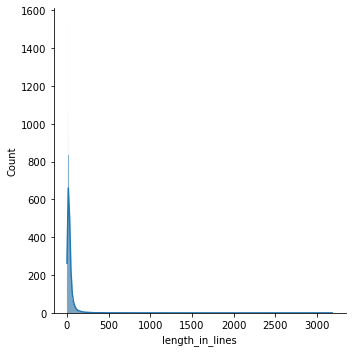

In [11]:
sns.displot(pf_df.length_in_lines, kde=True)

In [52]:
# filtering outliers with zscore
from scipy import stats
clean_df = pf_df[(np.abs(stats.zscore(pf_df.length_in_lines)) < 1.5)]

In [53]:
# filter sub-haiku length works and sentential logic prose poems
clean_df = clean_df[clean_df.length_in_lines > 2]

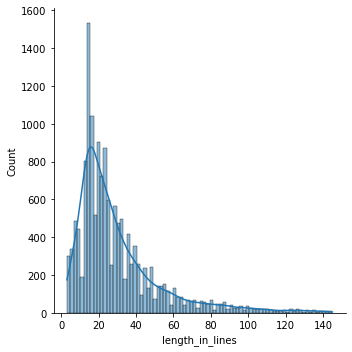

In [54]:
sns.displot(clean_df.length_in_lines, kde=True)

In [55]:
# create lexical diversity feature for each poem
def lexical_diversity(line_list):
    doc_string = ' '.join(line_list)
    words = word_tokenize(doc_string)
    return (len(set(words))/len(words))
        
clean_df['lexical_diversity'] = clean_df.line.map(lexical_diversity)

In [56]:
clean_df.head()

,author,title,content,line,length_in_lines,lexical_diversity
1,Hailey Leithauser,0,"Philosophic\nin its complex, ovoid emptiness,\...","[philosophic, in its complex ovoid emptiness,...",15,0.863636
2,Jody Gladding,1-800-FEAR,We'd like to talk with you about fear t...,[we'd like to talk with you about fear ...,11,0.644068
3,Joseph Brodsky,1 January 1965,The Wise Men will unlearn your name.\nAbove yo...,"[the wise men will unlearn your name, above yo...",24,0.679739
4,Ted Berrigan,3 Pages,For Jack Collom\n10 Things I do Every Day\n\np...,"[for jack collom, things i do every day, play ...",26,0.846154
5,Joe Brainard,30 One-Liners,WINTER\nMore time is spent at the window.\n\nS...,"[winter, more time is spent at the window, sum...",65,0.575843


In [57]:
def lines2words(list_of_lines):
    text = list_of_lines
    while not isinstance(text, str):
        try:
            text = ' '.join(text)
        except TypeError:
            try:
                   text = ' '.join([item for sublist in text for item in sublist])
            except:
                print(f"problem with {text}")
    return text.split()

In [58]:
poems_corpus = clean_df.line.map(lines2words)
clean_df['words'] = poems_corpus

In [59]:
# create and use function to map words column to their lengths in characters
def wds2len(list_of_words):
    return [len(word) for word in list_of_words]

clean_df['word_lengths'] = clean_df.words.map(wds2len)

In [60]:
clean_df['max_word_length'] = clean_df.word_lengths.map(np.max)

In [61]:
print(clean_df.shape)
clean_df[['content', 'line', 'words', 'length_in_lines', 'lexical_diversity', 'word_lengths', 'max_word_length']].head()

(14889, 9)


,content,line,words,length_in_lines,lexical_diversity,word_lengths,max_word_length
1,"Philosophic\nin its complex, ovoid emptiness,\...","[philosophic, in its complex ovoid emptiness,...","[philosophic, in, its, complex, ovoid, emptine...",15,0.863636,"[11, 2, 3, 7, 5, 9, 1, 8, 6, 6, 2, 2, 1, 4, 2,...",11
2,We'd like to talk with you about fear t...,[we'd like to talk with you about fear ...,"[we'd, like, to, talk, with, you, about, fear,...",11,0.644068,"[4, 4, 2, 4, 4, 3, 5, 4, 4, 4, 2, 4, 6, 4, 2, ...",10
3,The Wise Men will unlearn your name.\nAbove yo...,"[the wise men will unlearn your name, above yo...","[the, wise, men, will, unlearn, your, name, ab...",24,0.679739,"[3, 4, 3, 4, 7, 4, 4, 5, 4, 4, 2, 4, 4, 5, 3, ...",12
4,For Jack Collom\n10 Things I do Every Day\n\np...,"[for jack collom, things i do every day, play ...","[for, jack, collom, things, i, do, every, day,...",26,0.846154,"[3, 4, 6, 6, 1, 2, 5, 3, 4, 5, 5, 4, 5, 3, 4, ...",13
5,WINTER\nMore time is spent at the window.\n\nS...,"[winter, more time is spent at the window, sum...","[winter, more, time, is, spent, at, the, windo...",65,0.575843,"[6, 4, 4, 2, 5, 2, 3, 6, 6, 3, 2, 5, 4, 3, 2, ...",11


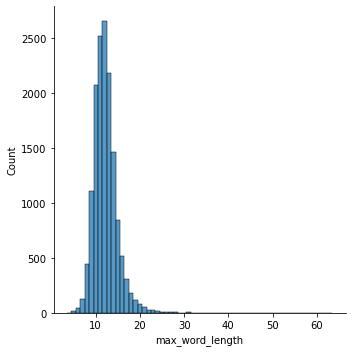

In [62]:
sns.displot(clean_df.max_word_length, discrete=True)

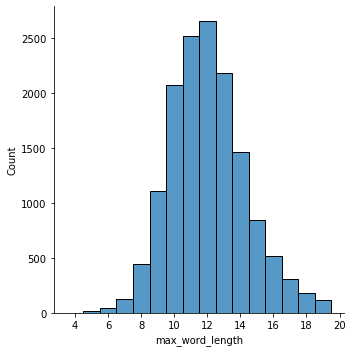

In [63]:
cleanest_df = clean_df[clean_df.max_word_length < 20]
sns.displot(cleanest_df.max_word_length, discrete=True)

In [64]:
with open('clean_df.pkl', 'wb') as f:
    pickle.dump(cleanest_df, f)

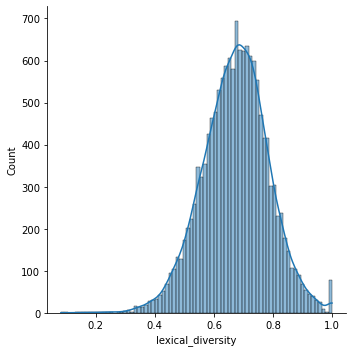

In [65]:
sns.displot(cleanest_df.lexical_diversity, kde=True)

In [66]:
cleanest_df.head()

,author,title,content,line,length_in_lines,lexical_diversity,words,word_lengths,max_word_length
1,Hailey Leithauser,0,"Philosophic\nin its complex, ovoid emptiness,\...","[philosophic, in its complex ovoid emptiness,...",15,0.863636,"[philosophic, in, its, complex, ovoid, emptine...","[11, 2, 3, 7, 5, 9, 1, 8, 6, 6, 2, 2, 1, 4, 2,...",11
2,Jody Gladding,1-800-FEAR,We'd like to talk with you about fear t...,[we'd like to talk with you about fear ...,11,0.644068,"[we'd, like, to, talk, with, you, about, fear,...","[4, 4, 2, 4, 4, 3, 5, 4, 4, 4, 2, 4, 6, 4, 2, ...",10
3,Joseph Brodsky,1 January 1965,The Wise Men will unlearn your name.\nAbove yo...,"[the wise men will unlearn your name, above yo...",24,0.679739,"[the, wise, men, will, unlearn, your, name, ab...","[3, 4, 3, 4, 7, 4, 4, 5, 4, 4, 2, 4, 4, 5, 3, ...",12
4,Ted Berrigan,3 Pages,For Jack Collom\n10 Things I do Every Day\n\np...,"[for jack collom, things i do every day, play ...",26,0.846154,"[for, jack, collom, things, i, do, every, day,...","[3, 4, 6, 6, 1, 2, 5, 3, 4, 5, 5, 4, 5, 3, 4, ...",13
5,Joe Brainard,30 One-Liners,WINTER\nMore time is spent at the window.\n\nS...,"[winter, more time is spent at the window, sum...",65,0.575843,"[winter, more, time, is, spent, at, the, windo...","[6, 4, 4, 2, 5, 2, 3, 6, 6, 3, 2, 5, 4, 3, 2, ...",11


In [67]:
line_df = cleanest_df.drop(['length_in_lines', 'content','lexical_diversity', 'word_lengths', 'words', 'max_word_length'],axis=1).explode('line')
line_df = line_df.reset_index(drop=True)

In [68]:
line_df['line_no'] = line_df.groupby(['author',"title"]).cumcount()+1

In [69]:
line_df.head()

,author,title,line,line_no
0,Hailey Leithauser,0,philosophic,1
1,Hailey Leithauser,0,in its complex ovoid emptiness,2
2,Hailey Leithauser,0,a skillful pundit coined it as a sort,3
3,Hailey Leithauser,0,of stopgap doorstop for those,4
4,Hailey Leithauser,0,quaint equations,5


In [70]:
line_df['words'] = line_df.line.map(str.split)
line_df.head()

,author,title,line,line_no,words
0,Hailey Leithauser,0,philosophic,1,[philosophic]
1,Hailey Leithauser,0,in its complex ovoid emptiness,2,"[in, its, complex, ovoid, emptiness]"
2,Hailey Leithauser,0,a skillful pundit coined it as a sort,3,"[a, skillful, pundit, coined, it, as, a, sort]"
3,Hailey Leithauser,0,of stopgap doorstop for those,4,"[of, stopgap, doorstop, for, those]"
4,Hailey Leithauser,0,quaint equations,5,"[quaint, equations]"


In [71]:
line_df['length_in_words'] = line_df.words.map(len)

In [72]:
line_df.describe()
len(line_df.loc[line_df.length_in_words == 606].words.to_list()[0])

606

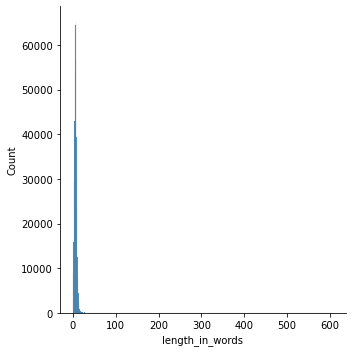

In [73]:
x = line_df.length_in_words
sns.displot(data=line_df, x='length_in_words', discrete=True)

In [74]:
# filtering outliers with zscore
from scipy import stats
clean_line_df = line_df[(np.abs(stats.zscore(line_df.length_in_words)) < 2)].copy()

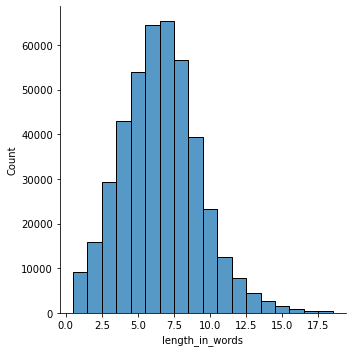

In [75]:
sns.displot(data=clean_line_df, x='length_in_words', discrete=True)

In [76]:
line_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 433998 entries, 0 to 433997
Data columns (total 6 columns):
 #   Column           Non-Null Count   Dtype   
---  ------           --------------   -----   
 0   author           433998 non-null  category
 1   title            433998 non-null  object  
 2   line             433998 non-null  object  
 3   line_no          433998 non-null  int64   
 4   words            433998 non-null  object  
 5   length_in_words  433998 non-null  int64   
dtypes: category(1), int64(2), object(3)
memory usage: 17.5+ MB


In [77]:
clean_line_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 431229 entries, 0 to 433997
Data columns (total 6 columns):
 #   Column           Non-Null Count   Dtype   
---  ------           --------------   -----   
 0   author           431229 non-null  category
 1   title            431229 non-null  object  
 2   line             431229 non-null  object  
 3   line_no          431229 non-null  int64   
 4   words            431229 non-null  object  
 5   length_in_words  431229 non-null  int64   
dtypes: category(1), int64(2), object(3)
memory usage: 20.7+ MB


In [78]:
clean_line_df['lexical_diversity'] = clean_line_df.words.map(lexical_diversity)
clean_line_df['word_lengths'] = clean_line_df.words.map(wds2len)

In [79]:
clean_line_df['max_word_length'] = clean_line_df.word_lengths.map(np.max)
cleanest_line_df = clean_line_df[(stats.zscore(clean_line_df.max_word_length)) < 2].copy()

In [80]:
cleanest_df.drop(['content','line','words'],axis=1)

,author,title,length_in_lines,lexical_diversity,word_lengths,max_word_length
1,Hailey Leithauser,0,15,0.863636,"[11, 2, 3, 7, 5, 9, 1, 8, 6, 6, 2, 2, 1, 4, 2,...",11
2,Jody Gladding,1-800-FEAR,11,0.644068,"[4, 4, 2, 4, 4, 3, 5, 4, 4, 4, 2, 4, 6, 4, 2, ...",10
3,Joseph Brodsky,1 January 1965,24,0.679739,"[3, 4, 3, 4, 7, 4, 4, 5, 4, 4, 2, 4, 4, 5, 3, ...",12
4,Ted Berrigan,3 Pages,26,0.846154,"[3, 4, 6, 6, 1, 2, 5, 3, 4, 5, 5, 4, 5, 3, 4, ...",13
5,Joe Brainard,30 One-Liners,65,0.575843,"[6, 4, 4, 2, 5, 2, 3, 6, 6, 3, 2, 5, 4, 3, 2, ...",11
...,...,...,...,...,...,...
15647,Hannah Gamble,Your Invitation to a Modest Breakfast,27,0.626667,"[3, 3, 4, 2, 5, 7, 3, 2, 3, 4, 4, 3, 4, 2, 5, ...",9
15648,Eleni Sikelianos,Your Kingdom\n \n \n \n Launch Audio in a N...,35,0.716418,"[2, 3, 4, 3, 3, 4, 4, 3, 3, 3, 9, 6, 7, 8, 3, ...",14
15649,Susan Elizabeth Howe,“Your Luck Is About To Change”,25,0.756579,"[1, 7, 6, 7, 11, 7, 4, 2, 3, 4, 6, 9, 11, 2, 1...",15
15650,Andrew Shields,Your Mileage May Vary,4,0.741935,"[3, 4, 5, 2, 3, 5, 3, 3, 3, 4, 4, 3, 4, 2, 3, ...",9


In [81]:
cleanest_line_df.head()

,author,title,line,line_no,words,length_in_words,lexical_diversity,word_lengths,max_word_length
0,Hailey Leithauser,0,philosophic,1,[philosophic],1,1.000,[11],11
1,Hailey Leithauser,0,in its complex ovoid emptiness,2,"[in, its, complex, ovoid, emptiness]",5,1.000,"[2, 3, 7, 5, 9]",9
2,Hailey Leithauser,0,a skillful pundit coined it as a sort,3,"[a, skillful, pundit, coined, it, as, a, sort]",8,0.875,"[1, 8, 6, 6, 2, 2, 1, 4]",8
3,Hailey Leithauser,0,of stopgap doorstop for those,4,"[of, stopgap, doorstop, for, those]",5,1.000,"[2, 7, 8, 3, 5]",8
4,Hailey Leithauser,0,quaint equations,5,"[quaint, equations]",2,1.000,"[6, 9]",9


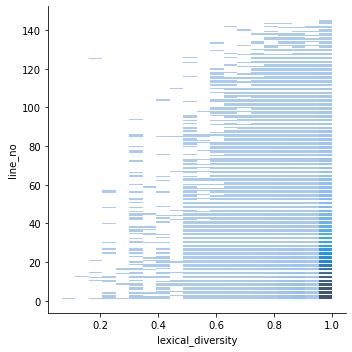

In [82]:
sns.displot(data=cleanest_line_df, x="lexical_diversity", y="line_no")

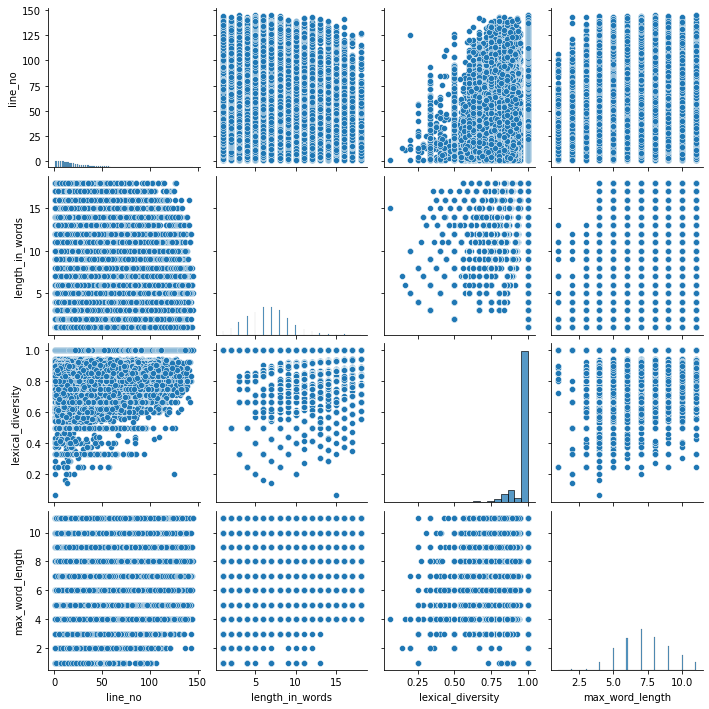

In [83]:
sns.pairplot(data=cleanest_line_df.drop(['title','line','words','word_lengths'], axis=1))

In [84]:
line_lexical = cleanest_line_df.drop(['line','words','word_lengths'], axis=1)

<AxesSubplot:xlabel='lexical_diversity', ylabel='length_in_words'>

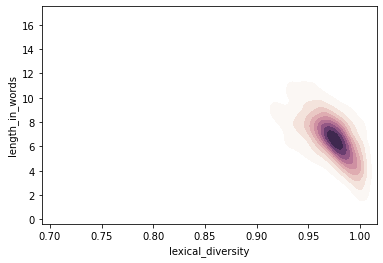

In [85]:
# author_line_lexical.reset_index(inplace=True)
cmap = sns.cubehelix_palette(light=1, as_cmap=True)

sns.kdeplot(data=line_lexical.groupby(['author']).mean(), x='lexical_diversity',y='length_in_words', cmap=cmap, fill=True)

In [86]:
line_lexical.describe()

,line_no,length_in_words,lexical_diversity,max_word_length
count,411858.000000,411858.000000,411858.000000,411858.000000
mean,24.307528,6.592976,0.971910,7.255469
std,23.063484,2.709030,0.068062,1.819939
min,1.000000,1.000000,0.066667,1.000000
25%,8.000000,5.000000,1.000000,6.000000
50%,17.000000,7.000000,1.000000,7.000000
75%,33.000000,8.000000,1.000000,9.000000
max,145.000000,18.000000,1.000000,11.000000


# Part of Speech Tagging

In [87]:
# initialize pipeline for tagging
import spacy
tag_nlp = spacy.load("en_core_web_sm", exclude=["parser", "attribute_ruler", "lemmatizer", "ner"])

In [88]:
tag_nlp.pipeline

[('tok2vec', <spacy.pipeline.tok2vec.Tok2Vec at 0x26432b42770>),
 ('tagger', <spacy.pipeline.tagger.Tagger at 0x26432b58ea0>)]

In [89]:
# define tag pipe function
def tag_pipe(texts):
    pipe_out = []
    for doc in tag_nlp.pipe(texts):
        pipe_out.append([str(token.tag_) for token in doc])
    return pipe_out

In [90]:
# populate part of speech tag column for lines
cleanest_line_df['pos_tags'] = tag_pipe(cleanest_line_df.line)
cleanest_line_df.head()

,author,title,line,line_no,words,length_in_words,lexical_diversity,word_lengths,max_word_length,pos_tags
0,Hailey Leithauser,0,philosophic,1,[philosophic],1,1.000,[11],11,[JJ]
1,Hailey Leithauser,0,in its complex ovoid emptiness,2,"[in, its, complex, ovoid, emptiness]",5,1.000,"[2, 3, 7, 5, 9]",9,"[IN, PRP$, JJ, PRP, JJ, NN]"
2,Hailey Leithauser,0,a skillful pundit coined it as a sort,3,"[a, skillful, pundit, coined, it, as, a, sort]",8,0.875,"[1, 8, 6, 6, 2, 2, 1, 4]",8,"[DT, JJ, NN, VBD, PRP, IN, DT, NN]"
3,Hailey Leithauser,0,of stopgap doorstop for those,4,"[of, stopgap, doorstop, for, those]",5,1.000,"[2, 7, 8, 3, 5]",8,"[IN, NN, VBP, IN, DT]"
4,Hailey Leithauser,0,quaint equations,5,"[quaint, equations]",2,1.000,"[6, 9]",9,"[NN, NNS]"


In [91]:
# populate part of speech tag column for poems
clean_poems = cleanest_df.line.map(lambda lines:' '.join(lines)).to_list()
cleanest_df['pos_tags'] = tag_pipe(clean_poems)

<ipython-input-91-aab6d35203da>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cleanest_df['pos_tags'] = tag_pipe(clean_poems)


In [92]:
print(clean_poems[0])

philosophic in its complex  ovoid emptiness a skillful pundit coined it as a sort of stopgap doorstop for those quaint equations romans never dreamt of  in form completely clever and discretea mirror come unsilvered loose watch face without the works a hollowed globe from tip to toe unbroken  it evades the grappling hooks of mass  tilts the thin rim of no thing remains embryonic sum non-cogito


In [93]:
cleanest_df.drop(['author','title','content', 'words'], axis=1).head()

,line,length_in_lines,lexical_diversity,word_lengths,max_word_length,pos_tags
1,"[philosophic, in its complex ovoid emptiness,...",15,0.863636,"[11, 2, 3, 7, 5, 9, 1, 8, 6, 6, 2, 2, 1, 4, 2,...",11,"[JJ, IN, PRP$, JJ, PRP, JJ, NN, DT, JJ, NN, VB..."
2,[we'd like to talk with you about fear ...,11,0.644068,"[4, 4, 2, 4, 4, 3, 5, 4, 4, 4, 2, 4, 6, 4, 2, ...",10,"[PRP, MD, PRP, IN, PRP, IN, PRP, VBP, PRP, IN,..."
3,"[the wise men will unlearn your name, above yo...",24,0.679739,"[3, 4, 3, 4, 7, 4, 4, 5, 4, 4, 2, 4, 4, 5, 3, ...",12,"[DT, JJ, NNS, MD, VB, PRP$, NN, IN, PRP$, NN, ..."
4,"[for jack collom, things i do every day, play ...",26,0.846154,"[3, 4, 6, 6, 1, 2, 5, 3, 4, 5, 5, 4, 5, 3, 4, ...",13,"[IN, JJ, NN, NNS, PRP, VBP, DT, NN, VB, NN, VB..."
5,"[winter, more time is spent at the window, sum...",65,0.575843,"[6, 4, 4, 2, 5, 2, 3, 6, 6, 3, 2, 5, 4, 3, 2, ...",11,"[NN, JJR, NN, VBZ, VBN, IN, DT, NN, NN, PRP, V..."


In [147]:
print(cleanest_df.shape)
cleanest_df.tail()


(14620, 10)


,author,title,content,line,length_in_lines,lexical_diversity,words,word_lengths,max_word_length,pos_tags
15647,Hannah Gamble,Your Invitation to a Modest Breakfast,"It’s too cold to smoke outside, but if you com...",[its too cold to smoke outside but if you com...,27,0.626667,"[its, too, cold, to, smoke, outside, but, if, ...","[3, 3, 4, 2, 5, 7, 3, 2, 3, 4, 4, 3, 4, 2, 5, ...",9,"[PRP$, RB, JJ, TO, VB, IN, ., CC, IN, PRP, VBP..."
15648,Eleni Sikelianos,Your Kingdom\n \n \n \n Launch Audio in a N...,if you like let the body feel\nall its own evo...,"[if you like let the body feel, all its own ev...",35,0.716418,"[if, you, like, let, the, body, feel, all, its...","[2, 3, 4, 3, 3, 4, 4, 3, 3, 3, 9, 6, 7, 8, 3, ...",14,"[IN, PRP, VBP, VB, DT, NN, VB, PDT, PRP$, JJ, ..."
15649,Susan Elizabeth Howe,“Your Luck Is About To Change”,(A fortune cookie)\nOminous inscrutable Chines...,"[a fortune cookie, ominous inscrutable chinese...",25,0.756579,"[a, fortune, cookie, ominous, inscrutable, chi...","[1, 7, 6, 7, 11, 7, 4, 2, 3, 4, 6, 9, 11, 2, 1...",15,"[DT, NN, NN, JJ, JJ, JJ, NN, TO, VB, RB, IN, N..."
15650,Andrew Shields,Your Mileage May Vary,1\nOur last night in the house was not our las...,"[our last night in the house was not our last,...",4,0.741935,"[our, last, night, in, the, house, was, not, o...","[3, 4, 5, 2, 3, 5, 3, 3, 3, 4, 4, 3, 4, 2, 3, ...",9,"[PRP$, JJ, NN, IN, DT, NN, VBD, RB, PRP$, JJ, ..."
15651,Joseph O. Legaspi,Your Mother Wears a House Dress,If your house\nis a dress\nit’ll fit like\nLos...,"[if your house, is a dress, itll fit like, los...",22,0.821429,"[if, your, house, is, a, dress, itll, fit, lik...","[2, 4, 5, 2, 1, 5, 4, 3, 4, 3, 7, 3, 3, 7, 4, ...",9,"[IN, PRP$, NN, VBZ, DT, NN, PRP, MD, VB, IN, N..."


# Frequency Distributions

In [95]:
# get df of word length frequency distributions
from collections import Counter
wl_freq_dists = cleanest_df.word_lengths.map(Counter)
wl_fd_df = wl_freq_dists.apply(pd.Series).add_prefix('wl_count_').fillna(0)

In [96]:
# get df of part of speech frequency distributions
pos_freq_dists = cleanest_df.pos_tags.map(Counter)
pos_fd_df = pos_freq_dists.apply(pd.Series).add_prefix('pos_count_').fillna(0)

In [97]:
# concatenate all dataframes
big_df = pd.concat([cleanest_df, wl_fd_df, pos_fd_df], axis=1).drop('word_lengths', 'pos_tags', axis=1)

In [98]:
# store big df for later use
with open('full_df.pkl', 'wb') as wlf:
    pickle.dump(big_df, wlf)

# Vectorization

## Training Doc2Vec model

In [99]:
from gensim.models.doc2vec import TaggedDocument
tagged_poems = [TaggedDocument(element,[i]) for i, element in enumerate(cleanest_df.words.values)]

In [100]:
tagged_poems[0]

TaggedDocument(words=['philosophic', 'in', 'its', 'complex', 'ovoid', 'emptiness', 'a', 'skillful', 'pundit', 'coined', 'it', 'as', 'a', 'sort', 'of', 'stopgap', 'doorstop', 'for', 'those', 'quaint', 'equations', 'romans', 'never', 'dreamt', 'of', 'in', 'form', 'completely', 'clever', 'and', 'discretea', 'mirror', 'come', 'unsilvered', 'loose', 'watch', 'face', 'without', 'the', 'works', 'a', 'hollowed', 'globe', 'from', 'tip', 'to', 'toe', 'unbroken', 'it', 'evades', 'the', 'grappling', 'hooks', 'of', 'mass', 'tilts', 'the', 'thin', 'rim', 'of', 'no', 'thing', 'remains', 'embryonic', 'sum', 'non-cogito'], tags=[0])

In [101]:
import multiprocessing
cores = multiprocessing.cpu_count()-1

In [102]:
from gensim.models import Doc2Vec
from tqdm import tqdm
model_dbow = Doc2Vec(vector_size = 2000, min_count = 0, dm = 0,
                     alpha=0.025, min_alpha=-0.0001, workers=cores)
model_dbow.build_vocab([x for x in tqdm(tagged_poems)])

100%|██████████| 14620/14620 [00:00<00:00, 2435778.53it/s]


In [103]:
model_dbow.corpus_count
len(model_dbow.wv.vocab)
print(list(model_dbow.wv.vocab.keys())[0:20])

['philosophic', 'in', 'its', 'complex', 'ovoid', 'emptiness', 'a', 'skillful', 'pundit', 'coined', 'it', 'as', 'sort', 'of', 'stopgap', 'doorstop', 'for', 'those', 'quaint', 'equations']


In [104]:
%%time
from sklearn import utils
from tqdm import tqdm
for epoch in range(50):
    model_dbow.train(utils.shuffle([x for x in tqdm(tagged_poems)]), total_examples=model_dbow.corpus_count, epochs=1)
    model_dbow.alpha -= 0.002
    model_dbow.min_alpha = model_dbow.alpha

100%|██████████| 14620/14620 [00:00<00:00, 2924211.94it/s]


Wall time: 2min 29s


In [105]:
model_dbow.docvecs.vectors_docs.shape

(14620, 2000)

In [106]:
model_dbow.save("poem_doc2vec_dbow2000.pkl")

In [107]:
model_dbow.wv.most_similar('he')

[('gears', 0.09201311320066452),
 ('warding', 0.09156562387943268),
 ('whiskered', 0.08967889845371246),
 ('burials', 0.08685743063688278),
 ('remorse', 0.08330434560775757),
 ('bloaw', 0.08317043632268906),
 ('jones', 0.08286184072494507),
 ('true-to-selfness', 0.08268803358078003),
 ('star-signs', 0.08254549652338028),
 ('cartoons', 0.08245792984962463)]

In [108]:
model_dbow.wv.most_similar('his')

[('winter-seeming', 0.09880177676677704),
 ('poises', 0.08742111921310425),
 ('precancerous', 0.08488655090332031),
 ('found', 0.08404888957738876),
 ('suave', 0.08387415111064911),
 ('period', 0.083775594830513),
 ('liquors', 0.0832766741514206),
 ('kennison', 0.0827195942401886),
 ('scrabbling', 0.08257489651441574),
 ('fixings', 0.08057714253664017)]

## encoding with doc2vec

In [109]:
poems = cleanest_df.words.to_list()
poem_vector=[]

t = 1000

for i in range(len(poems)):
    if i % t == 0:
        print("poem", i, ":", poems[i])
        print("***")
    poem = poems[i]
    poem_vector.append(model_dbow.infer_vector(poem))

poem 0 : ['philosophic', 'in', 'its', 'complex', 'ovoid', 'emptiness', 'a', 'skillful', 'pundit', 'coined', 'it', 'as', 'a', 'sort', 'of', 'stopgap', 'doorstop', 'for', 'those', 'quaint', 'equations', 'romans', 'never', 'dreamt', 'of', 'in', 'form', 'completely', 'clever', 'and', 'discretea', 'mirror', 'come', 'unsilvered', 'loose', 'watch', 'face', 'without', 'the', 'works', 'a', 'hollowed', 'globe', 'from', 'tip', 'to', 'toe', 'unbroken', 'it', 'evades', 'the', 'grappling', 'hooks', 'of', 'mass', 'tilts', 'the', 'thin', 'rim', 'of', 'no', 'thing', 'remains', 'embryonic', 'sum', 'non-cogito']
***
poem 1000 : ['did', 'your', 'child', 'lose', 'acquired', 'speech', 'a', 'fount', 'and', 'then', 'silence', 'a', 'none', 'an', 'ellipse', 'between', 'his', 'breath', 'through', 'the', 'seams', 'of', 'our', 'windows', 'whistle', 'of', 'days', 'impossible', 'bowl', 'of', 'a', 'mouth', 'the', 'open', 'cupboard', 'vowels', 'rounded', 'up', 'and', 'swept', 'under', 'the', 'rug', 'does', 'your', 'ch

In [110]:
# store vectors for convenience
X = np.vstack(poem_vector)
print(X.shape) 

(14620, 2000)


In [ ]:
X = model_dbow.docvecs.vectors_docs

# Clustering



In [111]:
# perform normalization and PCA and output components
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler, normalize
X_normalized = pd.DataFrame(normalize(StandardScaler().fit_transform(X)))

pca_99 = PCA(n_components = 0.99)
pca_99.fit(X_normalized)
reduced = pca_99.transform(X_normalized)

X_pc = PCA(n_components = 2).fit_transform(X_normalized)
X_principal = pd.DataFrame(X_pc)
X_principal.columns = ['P1', 'P2']

## KMeans

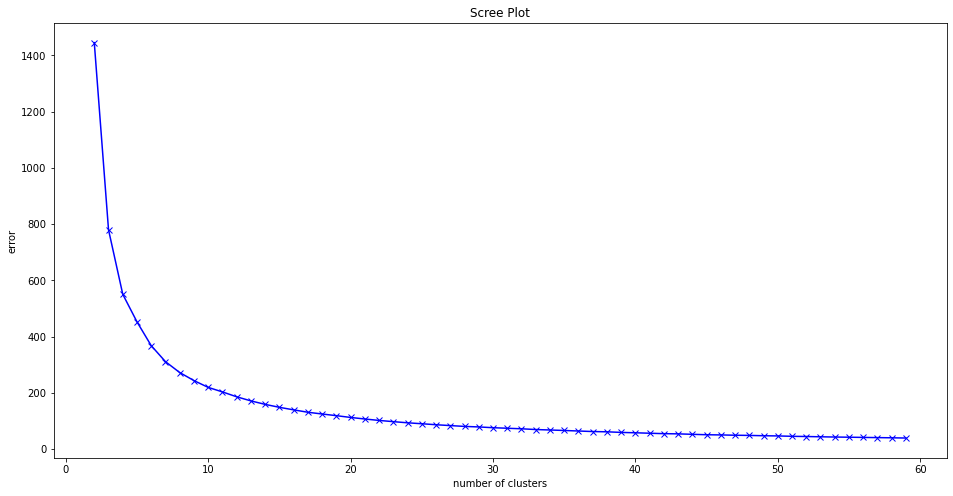

In [112]:
# determine best number of clusters for KMeans Clustering
from sklearn.cluster import KMeans
to_fit = X_principal
error = []
num_cluster_range = range(2,60)
for num_cluster in num_cluster_range:
    k_mean_model = KMeans(n_clusters=num_cluster, init = 'k-means++')
    k_mean_model.fit(to_fit)
    error.append(k_mean_model.inertia_)
plt.figure(figsize=(16,8))
plt.plot(num_cluster_range, error, 'bx-')
plt.xlabel('number of clusters')
plt.ylabel('error')
plt.title('Scree Plot')
plt.show()

9


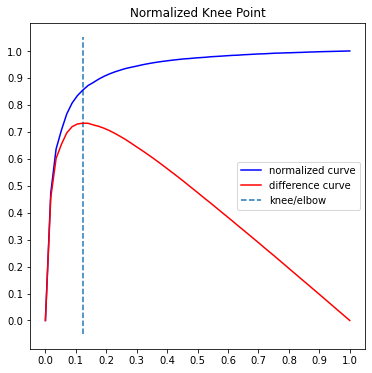

In [113]:
from kneed import KneeLocator
kn = KneeLocator(num_cluster_range, error, curve='convex', direction='decreasing')
print(kn.knee)
kn.plot_knee_normalized()

For n_clusters = 2 The average silhouette_score is : 0.6492264
For n_clusters = 3 The average silhouette_score is : 0.4932849
For n_clusters = 4 The average silhouette_score is : 0.44480404
For n_clusters = 5 The average silhouette_score is : 0.39028448
For n_clusters = 6 The average silhouette_score is : 0.4087556
For n_clusters = 7 The average silhouette_score is : 0.39234716
For n_clusters = 8 The average silhouette_score is : 0.39168385
For n_clusters = 9 The average silhouette_score is : 0.38521507
For n_clusters = 10 The average silhouette_score is : 0.3812599
For n_clusters = 11 The average silhouette_score is : 0.37716636
For n_clusters = 12 The average silhouette_score is : 0.37555683
For n_clusters = 13 The average silhouette_score is : 0.3732191
For n_clusters = 14 The average silhouette_score is : 0.3781545
For n_clusters = 15 The average silhouette_score is : 0.37558356
For n_clusters = 16 The average silhouette_score is : 0.3730651
For n_clusters = 17 The average silhouet

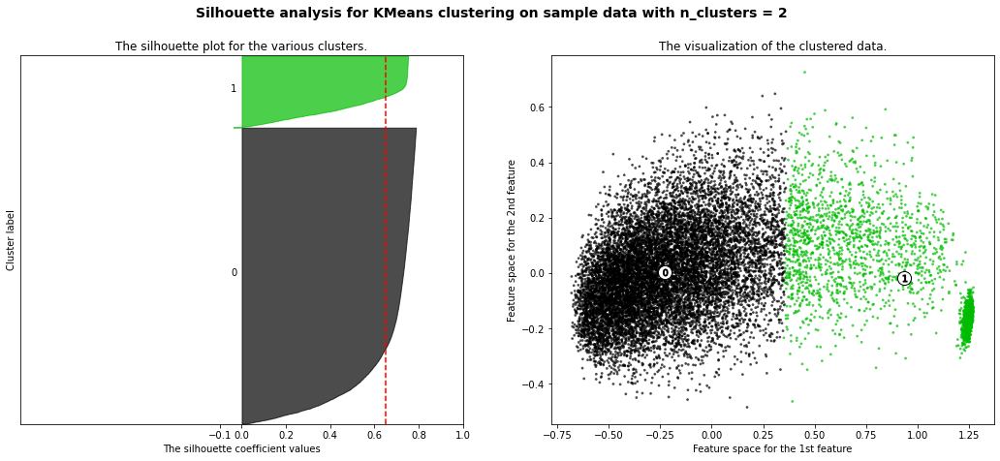

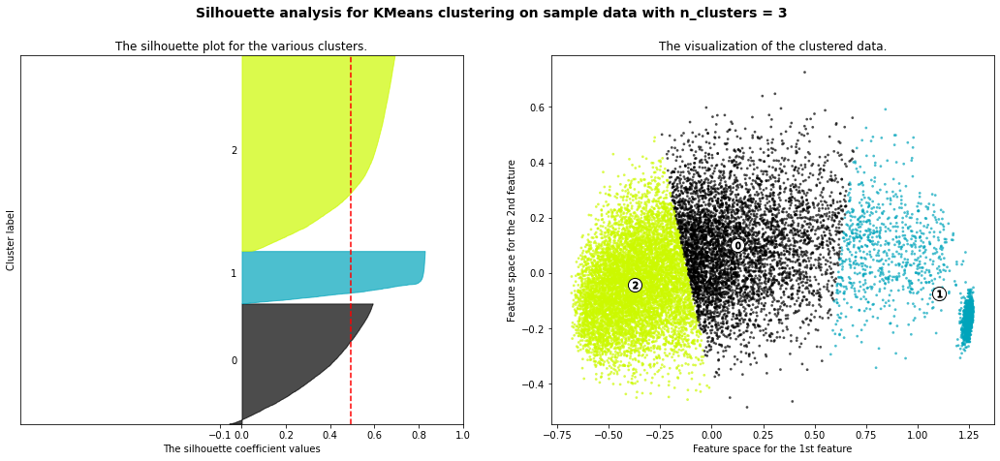

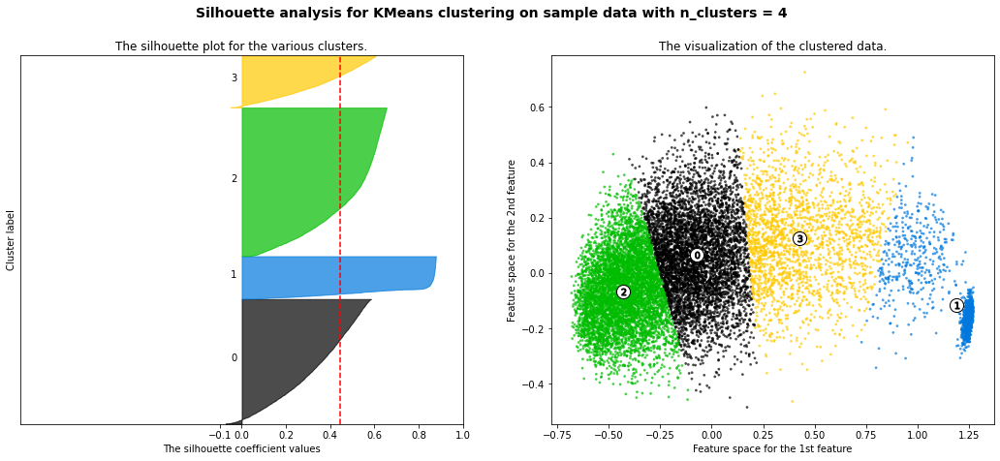

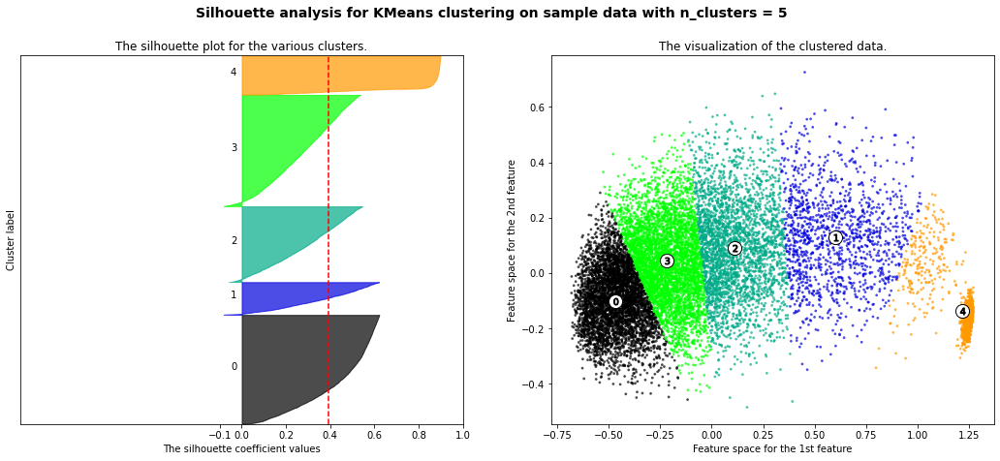

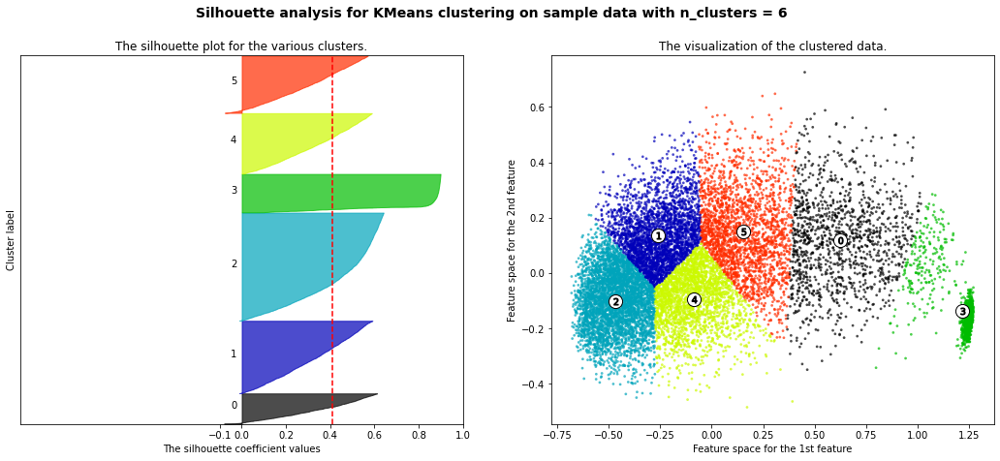

...

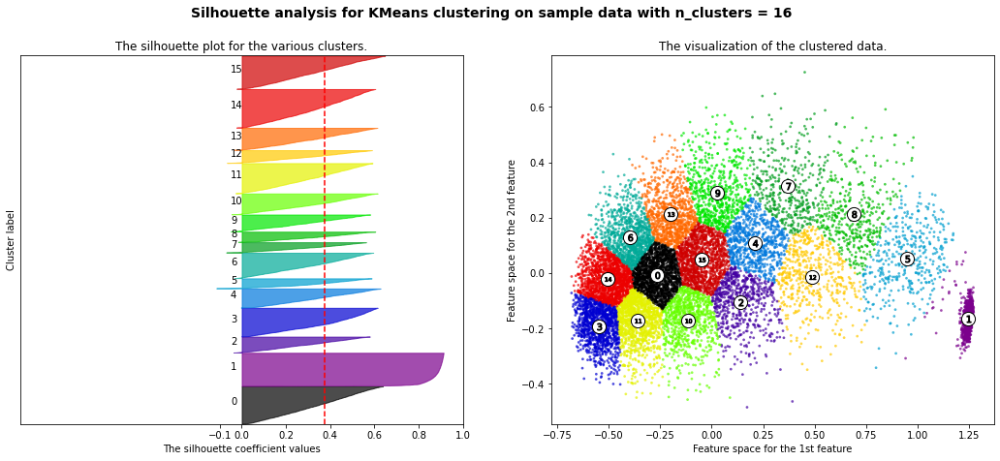

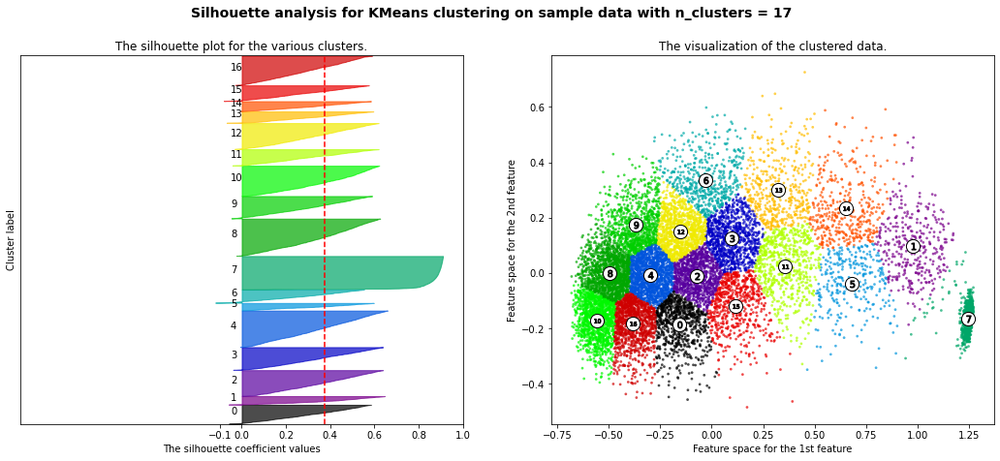

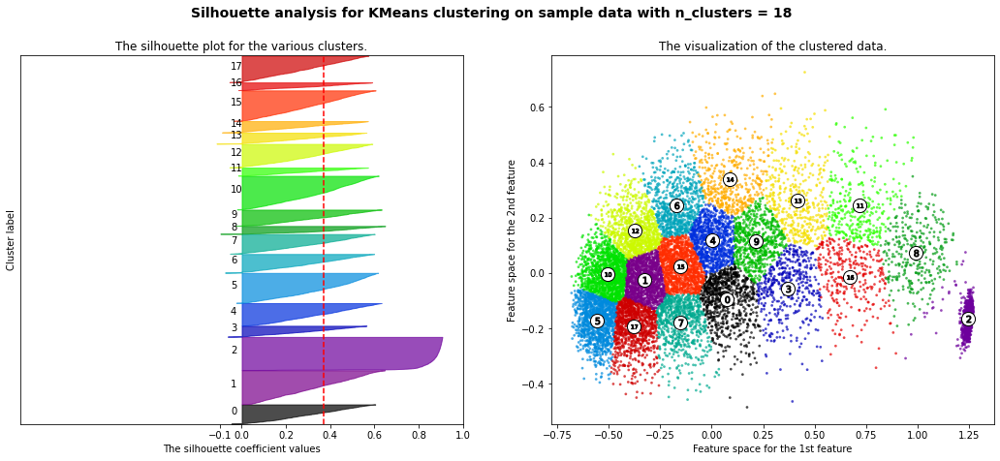

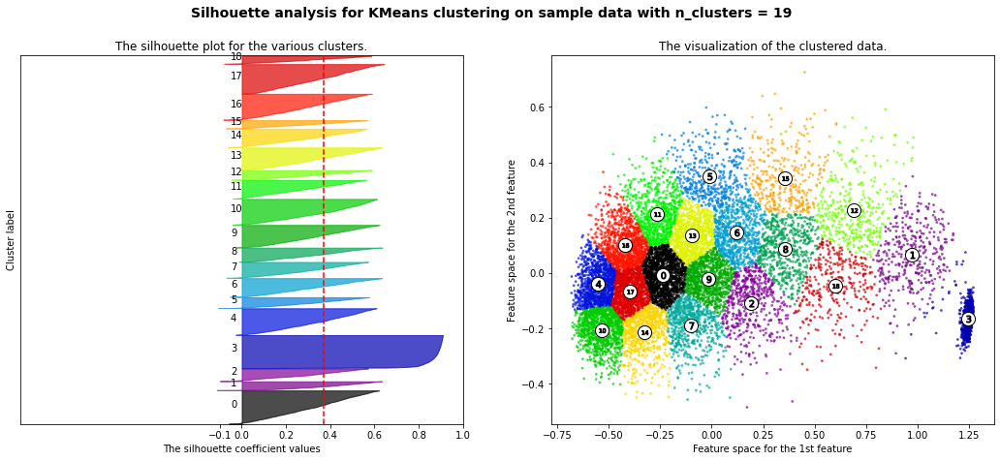

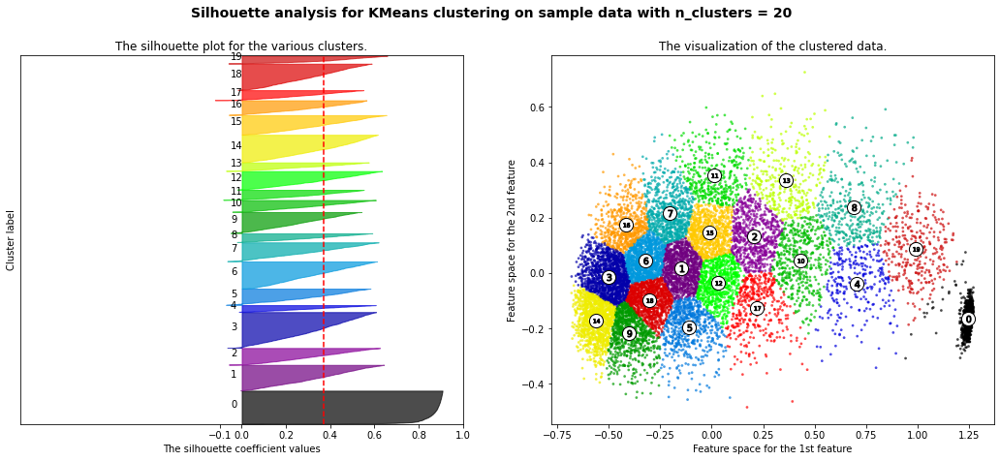

In [114]:
# from https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html
from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.cm as cm

# y = clean_poem_df.title
range_n_clusters = list(range(2,21))

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    ax1.set_xlim([-1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    km_df = X_principal.copy()
    cluster_labels = clusterer.fit_predict(km_df)
    km_df['km_labels']=cluster_labels

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X_principal, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X_principal, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
     # Plotting resulting clusters
    
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(km_df['P1'],km_df['P2'],c=colors, marker='.', s=30, lw=0, alpha=0.7, edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()

## DBSCAN Clustering

In [115]:
# using K-Nearest Neighbors to estimate best epsilon for DBSCAN
from sklearn.neighbors import NearestNeighbors
knn_model = NearestNeighbors(n_neighbors=2)
nbrs = knn_model.fit(X_principal)
distances, indices = nbrs.kneighbors(X_principal)

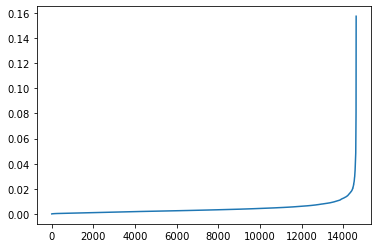

In [116]:
distances = np.sort(distances, axis=0)
distances1 = distances[:,1]
plt.plot(distances1)

In [117]:
df = pd.DataFrame(distances).iloc[:,1]

In [118]:
df = df.reset_index()
df.columns = ['id','distance']
print(df.head())

   id  distance
0   0  0.000039
1   1  0.000039
2   2  0.000041
3   3  0.000041
4   4  0.000064


In [119]:
sensitivity = [1, 3, 5, 10, 100, 200, 400]

# hold knee points for each sensitivity
knees = []
norm_knees = []

# S should be chosen as a function of how many points are in the system (n)
n = 1000
x = df.id
y = df.distance
for s in sensitivity:
    kl = KneeLocator(x, y, curve='convex', direction='increasing', S=s)
    knees.append(kl.knee)
    norm_knees.append(kl.norm_knee)

print(f'Knees: {knees}')

print(f'Normalized Knees: {[nk.round(2) for nk in norm_knees]}')

Knees: [14616, 14421, 14181, 13764, 13359, 12695, 11934]
Normalized Knees: [0.0, 0.01, 0.03, 0.06, 0.09, 0.13, 0.18]


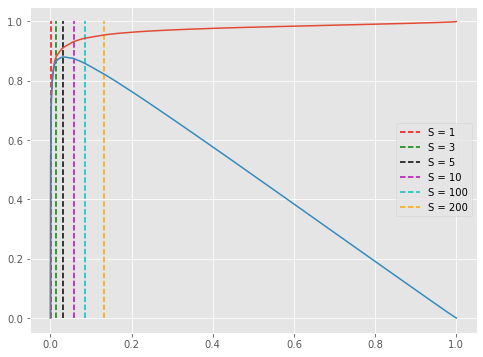

In [120]:
plt.style.use('ggplot');
plt.figure(figsize=(8, 6));
plt.plot(kl.x_normalized, kl.y_normalized);
plt.plot(kl.x_difference, kl.y_difference);
colors = ['r', 'g', 'k', 'm', 'c', 'orange']
for k, c, s in zip(norm_knees, colors, sensitivity):
    plt.vlines(k, 0, 1, linestyles='--', colors=c, label=f'S = {s}');
plt.legend();

14421
id          14421.000000
distance        0.018885
Name: 14421, dtype: float64


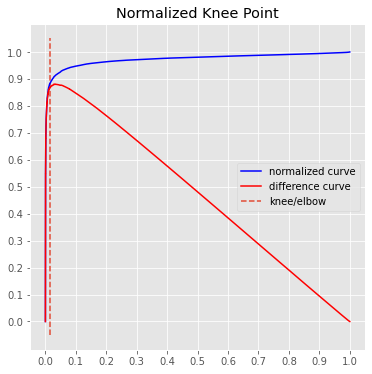

In [121]:
kn = KneeLocator(df.id,df.distance, curve='convex', direction='increasing', S=3)
print(kn.knee)
kn.plot_knee_normalized()
print(df.iloc[kn.knee])

In [122]:
# create function to plot DBSCAN clustering
from sklearn.cluster import DBSCAN
from sklearn import metrics

def plot_DBSCAN(db,X):
    if isinstance(X,pd.DataFrame):
        X = X.to_numpy()
    labels = db.labels_
    n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
    n_noise_ = list(labels).count(-1)
    
    core_samples_mask = np.zeros_like(labels, dtype=bool)
    core_samples_mask[db.core_sample_indices_] = True
    unique_labels = set(labels)
    colors = [plt.cm.Spectral(each)
              for each in np.linspace(0, 1, len(unique_labels))]
    for k, col in zip(unique_labels, colors):
        if k == -1:
            # Black used for noise.
            col = [0, 0, 0, 1]

        class_member_mask = (labels == k)

        xy = X[class_member_mask & core_samples_mask]
        plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
                 markeredgecolor='k', markersize=14)

        xy = X[class_member_mask & ~core_samples_mask]
        plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
                 markeredgecolor='k', markersize=6)

    plt.title('Estimated number of clusters: %d' % n_clusters_)
    plt.show()

In [123]:
# function to find best hyperparameters for dbscan
def dbgridsearch(X, epsilon_list, sample_list):
    dict_list = []
    for epsilon in epsilon_list:
        for m_sample in sample_list:
            db = DBSCAN(eps=epsilon, min_samples=m_sample).fit(X)
            labels = db.labels_
            n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
            if n_clusters_ > 1:
                n_noise_ = list(labels).count(-1)
                s_score = metrics.silhouette_score(X, labels)
                if s_score > 0:
                    results = {'epsilon':epsilon, \
                               'min_samples':m_sample, \
                               'n_clusters':n_clusters_, \
                               'n_noise':n_noise_, \
                               'silhouette':s_score}
                    print(results)
                    dict_list.append(results)
            
    return pd.DataFrame(dict_list)

In [124]:
epsilon_candidates = [0.01, 0.025, 0.05, 0.06, 0.09, 0.12, 0.15, 0.19, 0.25]
min_samples = [5, 10, 25, 50, 200]
db_results = dbgridsearch(X_principal,epsilon_candidates, min_samples)

{'epsilon': 0.025, 'min_samples': 25, 'n_clusters': 7, 'n_noise': 2994, 'silhouette': 0.032699734}
{'epsilon': 0.05, 'min_samples': 5, 'n_clusters': 2, 'n_noise': 47, 'silhouette': 0.2461075}
{'epsilon': 0.05, 'min_samples': 10, 'n_clusters': 3, 'n_noise': 103, 'silhouette': 0.39493895}
{'epsilon': 0.05, 'min_samples': 25, 'n_clusters': 3, 'n_noise': 478, 'silhouette': 0.44026503}
{'epsilon': 0.05, 'min_samples': 50, 'n_clusters': 4, 'n_noise': 1436, 'silhouette': 0.41240996}
{'epsilon': 0.05, 'min_samples': 200, 'n_clusters': 2, 'n_noise': 5469, 'silhouette': 0.37640125}
{'epsilon': 0.06, 'min_samples': 5, 'n_clusters': 2, 'n_noise': 26, 'silhouette': 0.24659537}
{'epsilon': 0.06, 'min_samples': 25, 'n_clusters': 2, 'n_noise': 226, 'silhouette': 0.45738927}
{'epsilon': 0.06, 'min_samples': 50, 'n_clusters': 2, 'n_noise': 929, 'silhouette': 0.5047753}
{'epsilon': 0.06, 'min_samples': 200, 'n_clusters': 2, 'n_noise': 3722, 'silhouette': 0.45552525}
{'epsilon': 0.09, 'min_samples': 200, 

In [125]:
print(db_results.describe())

         epsilon  min_samples  n_clusters      n_noise  silhouette
count  12.000000    12.000000   12.000000    12.000000   12.000000
mean    0.060417    82.916667    2.750000  1463.666667    0.386729
std     0.023785    87.657866    1.484771  1733.778288    0.146839
min     0.025000     5.000000    2.000000    26.000000    0.032700
25%     0.050000    21.250000    2.000000   195.250000    0.343950
50%     0.055000    37.500000    2.000000   735.500000    0.426337
75%     0.060000   200.000000    3.000000  1942.500000    0.469236
max     0.120000   200.000000    7.000000  5469.000000    0.539320


In [126]:
print(db_results[db_results.silhouette > 0].sort_values(by=['n_noise','epsilon']))
# sns.displot(data=db_results, x='silhouette', y='epsilon')
# sns.displot(data=db_results, x='n_clusters', y='silhouette')
# sns.scatterplot(data=db_results, x='epsilon', y='silhouette', hue='n_noise')

    epsilon  min_samples  n_clusters  n_noise  silhouette
6     0.060            5           2       26    0.246595
1     0.050            5           2       47    0.246108
2     0.050           10           3      103    0.394939
7     0.060           25           2      226    0.457389
3     0.050           25           3      478    0.440265
11    0.120          200           2      542    0.539320
8     0.060           50           2      929    0.504775
4     0.050           50           4     1436    0.412410
10    0.090          200           2     1592    0.534326
0     0.025           25           7     2994    0.032700
9     0.060          200           2     3722    0.455525
5     0.050          200           2     5469    0.376401


In [167]:
db = DBSCAN(eps=0.12, min_samples=200).fit(X_principal)

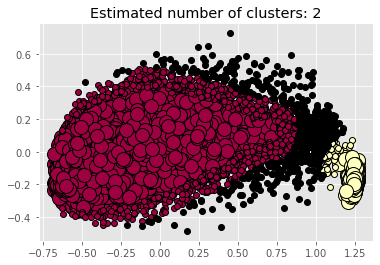

In [168]:
plot_DBSCAN(db,X_principal)

## Hierarchichal Clustering

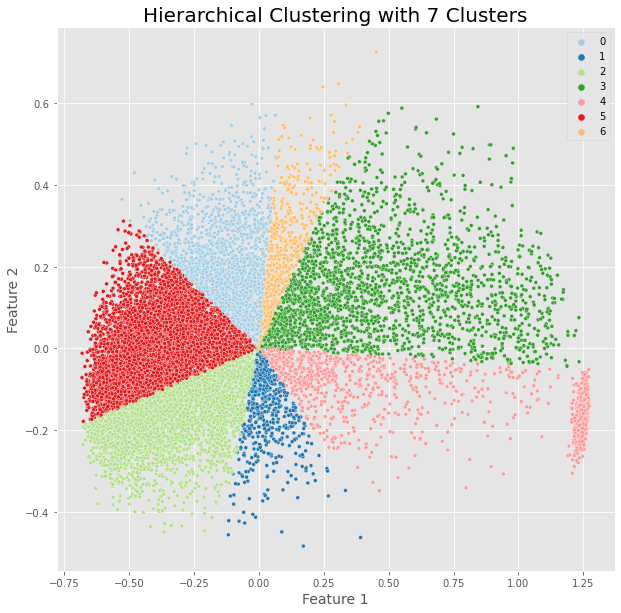

In [156]:
# clustering with hierarchical/agglomerative
from sklearn.cluster import AgglomerativeClustering
n_clusters=7
agg_mod = AgglomerativeClustering(n_clusters=n_clusters, affinity='cosine', linkage="complete")
agg_mod.fit(X_principal)

HR_df = X_principal.copy()
HR_df['HR_labels']=agg_mod.labels_

# Plotting resulting clusters
plt.figure(figsize=(10,10))
sns.scatterplot(data=HR_df, x ='P1',y='P2',hue='HR_labels',palette='Paired',s=15)
plt.title(f'Hierarchical Clustering with {n_clusters} Clusters',fontsize=20)
plt.xlabel('Feature 1',fontsize=14)
plt.ylabel('Feature 2',fontsize=14)
plt.legend(loc='upper right')
plt.show()

For n_clusters = 2 The average silhouette_score is : 0.665269
For n_clusters = 3 The average silhouette_score is : 0.47111806
For n_clusters = 4 The average silhouette_score is : 0.41796768
For n_clusters = 5 The average silhouette_score is : 0.4253512
For n_clusters = 6 The average silhouette_score is : 0.40296867
For n_clusters = 7 The average silhouette_score is : 0.33327043
For n_clusters = 8 The average silhouette_score is : 0.3475753
For n_clusters = 9 The average silhouette_score is : 0.3402454
For n_clusters = 10 The average silhouette_score is : 0.32122606
For n_clusters = 11 The average silhouette_score is : 0.29217082
For n_clusters = 12 The average silhouette_score is : 0.28673518
For n_clusters = 13 The average silhouette_score is : 0.29199746
For n_clusters = 14 The average silhouette_score is : 0.2954073
For n_clusters = 15 The average silhouette_score is : 0.29160914
For n_clusters = 16 The average silhouette_score is : 0.29703063
For n_clusters = 17 The average silhoue

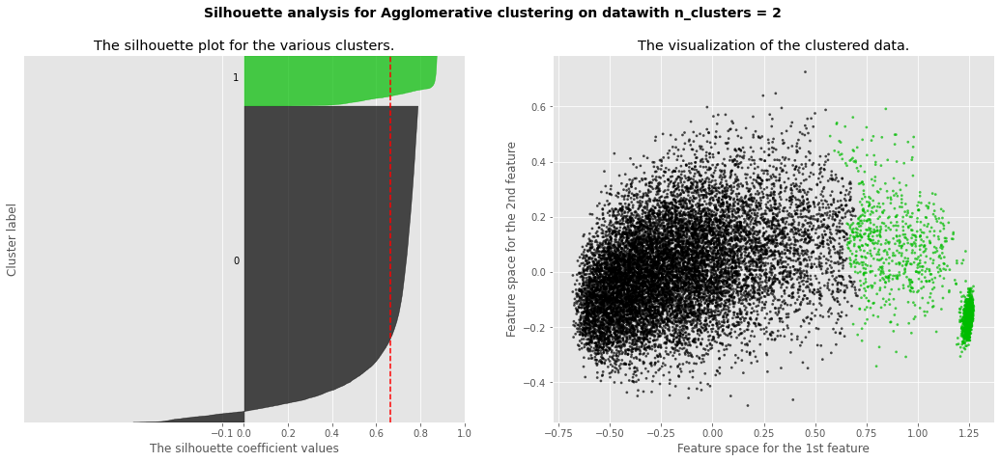

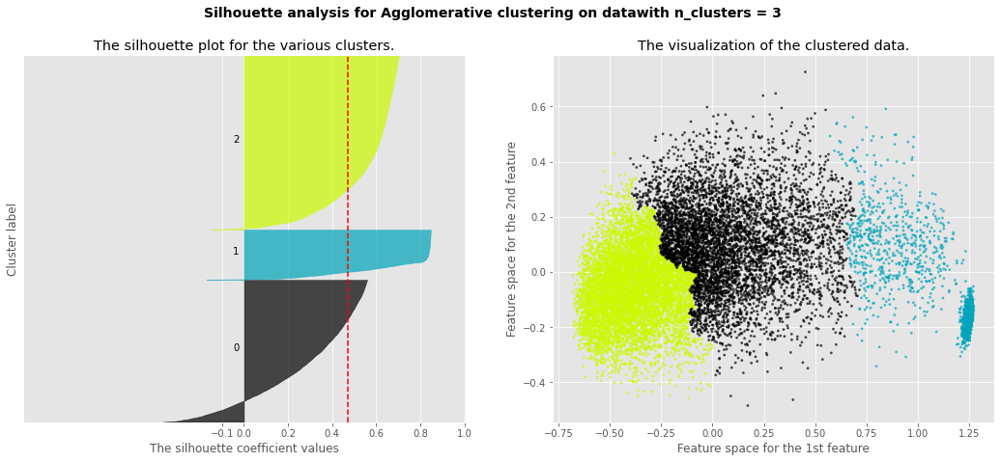

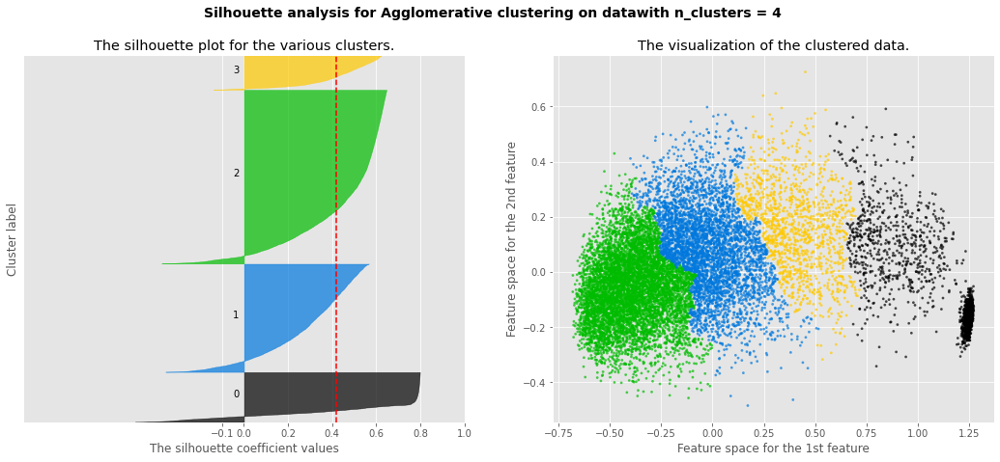

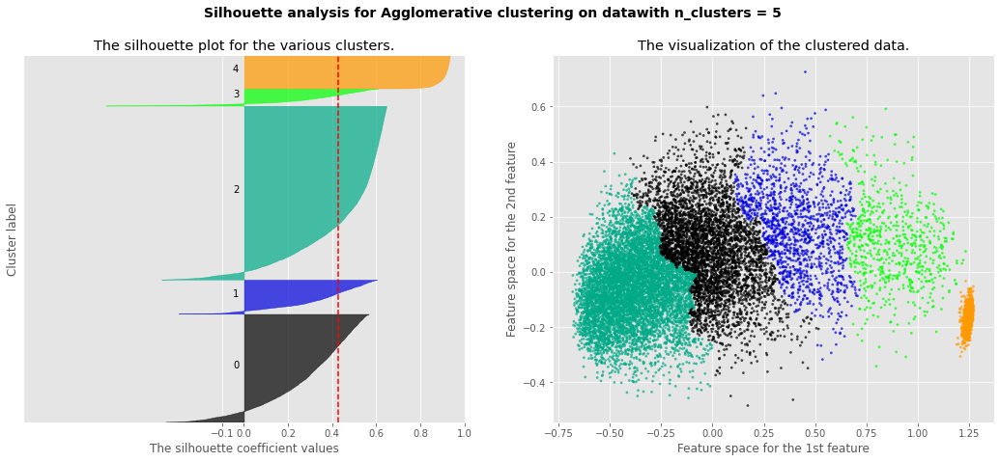

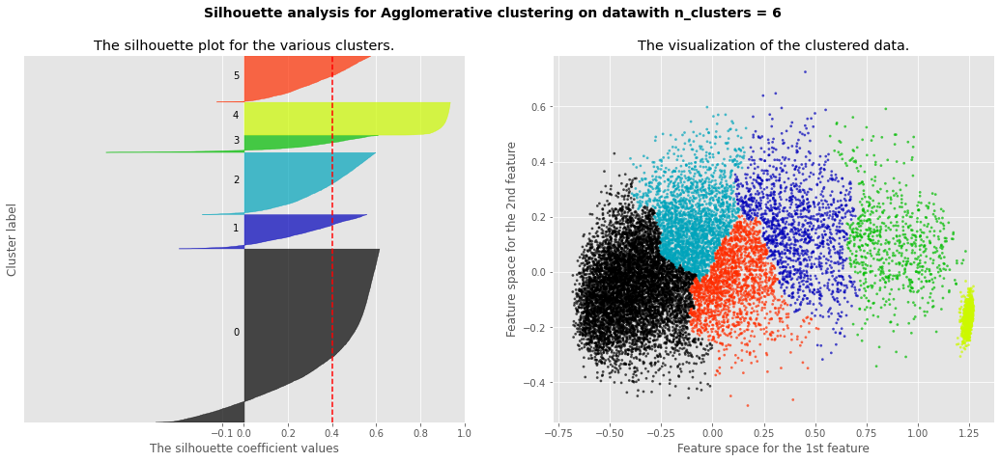

...

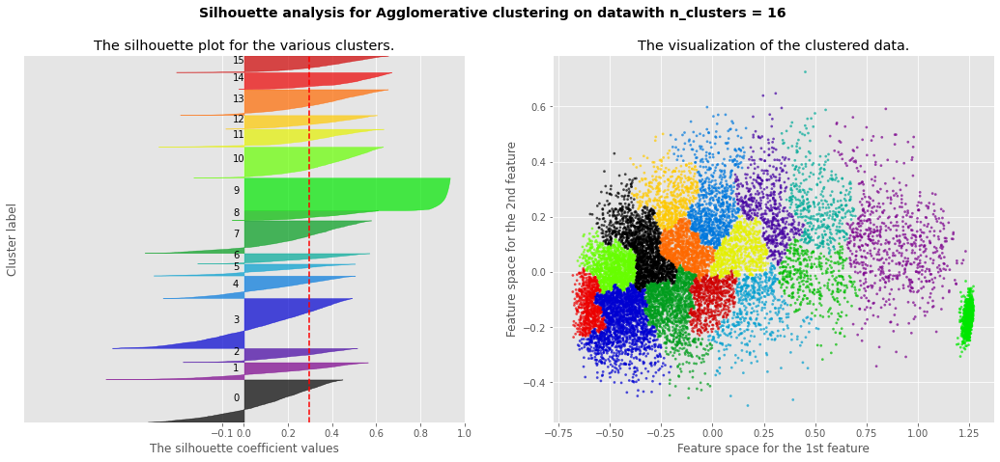

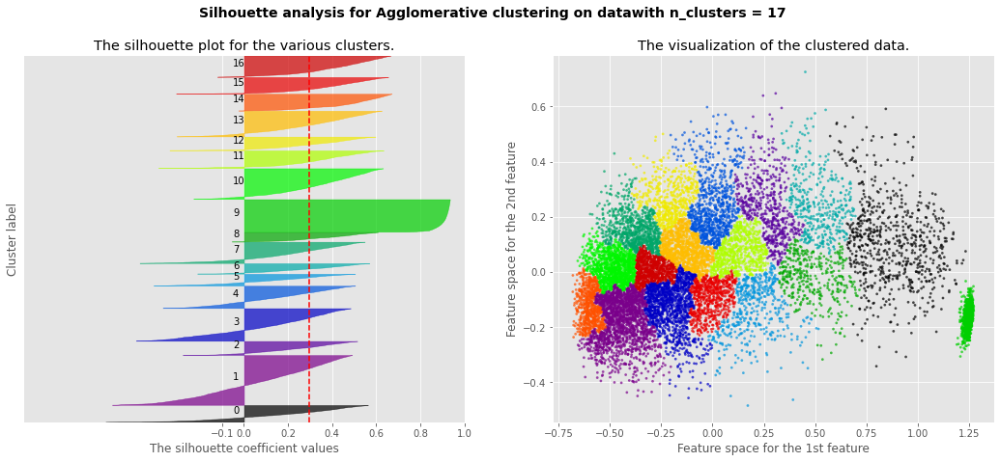

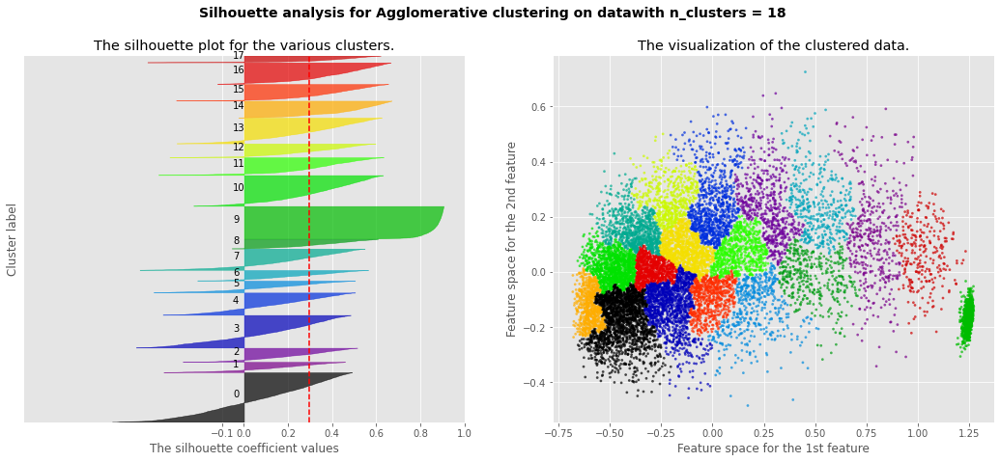

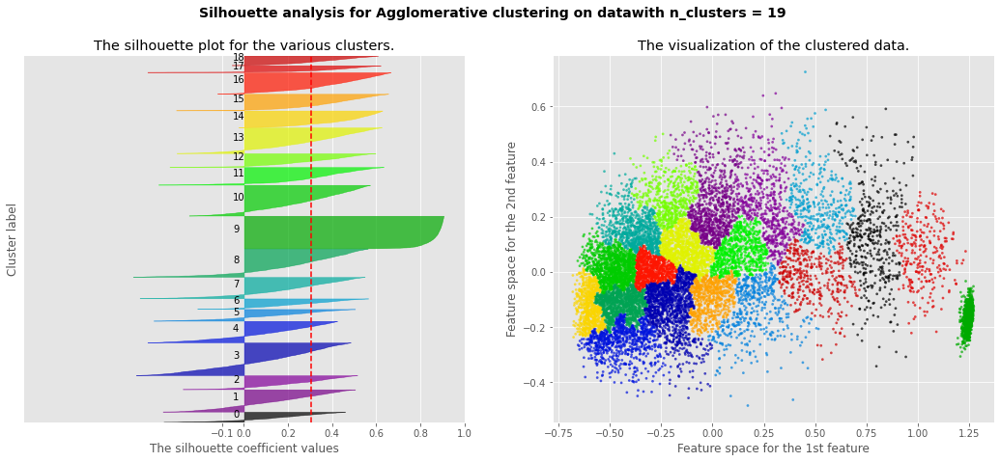

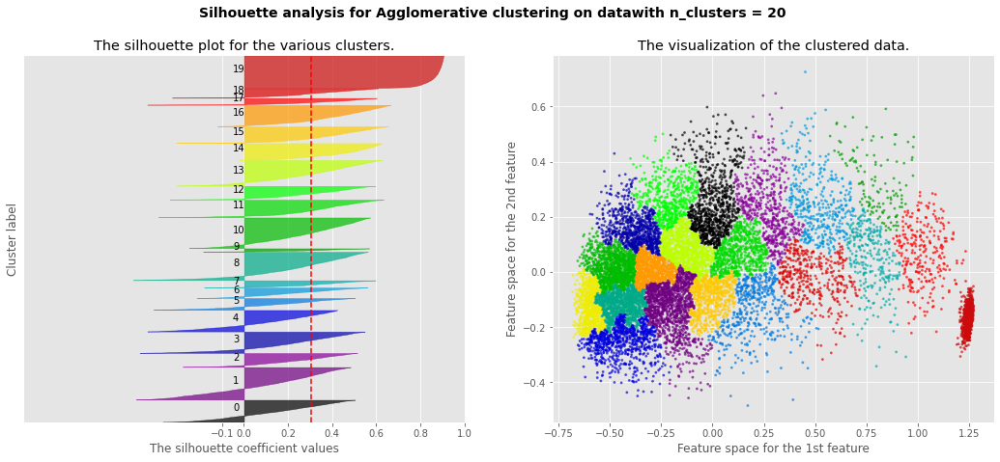

In [169]:
# iterate over various numbers of clusters for agglomerative clustering
range_n_clusters = list(range(2,21))

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    ax1.set_xlim([-1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = AgglomerativeClustering(n_clusters=n_clusters, affinity='euclidean')
    am_df = X_principal.copy()
    cluster_labels = clusterer.fit_predict(am_df)
    km_df['am_labels']=cluster_labels

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X_principal, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X_principal, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
     # Plotting resulting clusters
    
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(km_df['P1'],km_df['P2'],c=colors, marker='.', s=30, lw=0, alpha=0.7, edgecolor='k')

    # Labeling the clusters
#     centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
#     ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
#                 c="white", alpha=1, s=200, edgecolor='k')

#     for i, c in enumerate(centers):
#         ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
#                     s=50, edgecolor='k')

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Silhouette analysis for Agglomerative clustering on data"
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()

In [152]:
print(metrics.silhouette_score(X_principal, agg_mod.labels_))

0.10166249


## Gaussian Mixture Model Clustering

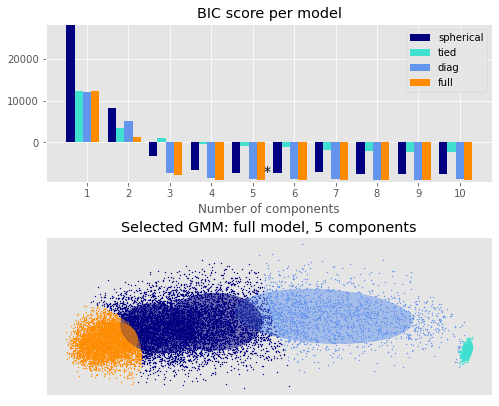

In [130]:
# gaussian mixture model -- https://scikit-learn.org/stable/auto_examples/mixture/plot_gmm_selection.html#sphx-glr-auto-examples-mixture-plot-gmm-selection-py
from sklearn import mixture
from scipy import linalg
import itertools
lowest_bic = np.infty
bic = []
n_components_range = range(1, 11)
cv_types = ['spherical', 'tied', 'diag', 'full']
for cv_type in cv_types:
    for n_components in n_components_range:
        # Fit a Gaussian mixture with EM
        gmm = mixture.GaussianMixture(n_components=n_components,
                                      covariance_type=cv_type)
        gmm.fit(X_principal)
        bic.append(gmm.bic(X_principal))
        if bic[-1] < lowest_bic:
            lowest_bic = bic[-1]
            best_gmm = gmm

bic = np.array(bic)
color_iter = itertools.cycle(['navy', 'turquoise', 'cornflowerblue',
                              'darkorange'])
clf = best_gmm
bars = []

# Plot the BIC scores
plt.figure(figsize=(8, 6))
spl = plt.subplot(2, 1, 1)
for i, (cv_type, color) in enumerate(zip(cv_types, color_iter)):
    xpos = np.array(n_components_range) + .2 * (i - 2)
    bars.append(plt.bar(xpos, bic[i * len(n_components_range):
                                  (i + 1) * len(n_components_range)],
                        width=.2, color=color))
plt.xticks(n_components_range)
plt.ylim([bic.min() * 1.01 - .01 * bic.max(), bic.max()])
plt.title('BIC score per model')
xpos = np.mod(bic.argmin(), len(n_components_range)) + .65 +\
    .2 * np.floor(bic.argmin() / len(n_components_range))
plt.text(xpos, bic.min() * 0.97 + .03 * bic.max(), '*', fontsize=14)
spl.set_xlabel('Number of components')
spl.legend([b[0] for b in bars], cv_types)

# Plot the winner
splot = plt.subplot(2, 1, 2)
Y_ = clf.predict(X_principal)
for i, (mean, cov, color) in enumerate(zip(clf.means_, clf.covariances_,
                                           color_iter)):
    v, w = linalg.eigh(cov)
    if not np.any(Y_ == i):
        continue
    plt.scatter(X_principal.to_numpy()[Y_ == i, 0], X_principal.to_numpy()[Y_ == i, 1], .8, color=color)

    # Plot an ellipse to show the Gaussian component
    angle = np.arctan2(w[0][1], w[0][0])
    angle = 180. * angle / np.pi  # convert to degrees
    v = 2. * np.sqrt(2.) * np.sqrt(v)
    ell = mpl.patches.Ellipse(mean, v[0], v[1], 180. + angle, color=color)
    ell.set_clip_box(splot.bbox)
    ell.set_alpha(.5)
    splot.add_artist(ell)

plt.xticks(())
plt.yticks(())
plt.title(f'Selected GMM: {best_gmm.covariance_type} model, '
          f'{best_gmm.n_components} components')
plt.subplots_adjust(hspace=.35, bottom=.02)
plt.show()